In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import sklearn
import pickle

from sklearn.preprocessing import StandardScaler
from sklearn.utils import check_random_state
from sklearn.decomposition import PCA

from nose.tools import assert_equal, assert_is_instance, assert_is_not
from numpy.testing import assert_array_equal, assert_array_almost_equal, assert_almost_equal
from pandas.util.testing import assert_frame_equal

from scipy.stats import pearsonr
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

import warnings
warnings.filterwarnings("ignore")

In [53]:
df = pd.read_csv('HR-Employee-Attrition.csv', index_col="Attrition")

In [54]:
df.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,,,,,,,,,,,,,,,,,,,,,
Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,...,1,80,0,8,0,1,6,4,0,5
No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,...,4,80,1,10,3,3,10,7,1,7
Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,...,2,80,0,7,3,3,0,0,0,0
No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,...,3,80,0,8,3,3,8,7,3,0
No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,...,4,80,1,6,3,3,2,2,2,2


In [55]:
#may not need
attrition = df.iloc[:,0:0]

In [56]:
travel = {'Non-Travel':0, 'Travel_Rarely':1, 'Travel_Frequently':2}

In [57]:
df.BusinessTravel = [travel[item] for item in df.BusinessTravel]


In [58]:
department = {'Human Resources':0, 'Research & Development':1, 'Sales':2}
df.Department = [department[item] for item in df.Department]
df.Department.head()

Attrition
Yes    2
No     1
Yes    1
No     1
No     1
Name: Department, dtype: int64

In [59]:
education = {'Human Resources':0, 'Life Sciences':1, 'Marketing':2, 'Medical':3, 'Technical Degree':4, 'Other':5}

In [69]:
df.EducationField = [education[item] for item in df.EducationField]
df.EducationField.head(10)

Attrition
Yes    1
No     1
Yes    5
No     1
No     3
No     1
No     3
No     1
No     1
No     3
Name: EducationField, dtype: int64

In [62]:
gender = {'Female':0, 'Male':1}
df.Gender = [gender[item] for item in df.Gender]
df.Gender.head()

Attrition
Yes    0
No     1
Yes    1
No     0
No     1
Name: Gender, dtype: int64

In [63]:
role = {'Human Resources':0, 'Healthcare Representative':1, 'Laboratory Technician':2, 'Manager':3, 'Manufacturing Director':4, 'Research Director':5, 'Research Scientist':6, 'Sales Executive':7, 'Sales Representative':8}
df.JobRole = [role[item] for item in df.JobRole]
df.JobRole.head()

Attrition
Yes    7
No     6
Yes    2
No     6
No     2
Name: JobRole, dtype: int64

In [64]:
status = {'Single':0, 'Married':1, 'Divorced':2}
df.MaritalStatus = [status[item] for item in df.MaritalStatus]
df.MaritalStatus.head()

Attrition
Yes    0
No     1
Yes    0
No     1
No     1
Name: MaritalStatus, dtype: int64

In [65]:
over18 = {'N':0, 'Y':1}
df.Over18 = [over18[item] for item in df.Over18]
df.Over18.head(10)

Attrition
Yes    1
No     1
Yes    1
No     1
No     1
No     1
No     1
No     1
No     1
No     1
Name: Over18, dtype: int64

In [66]:
OT = {'No':0, 'Yes':1}
df.OverTime = [OT[item] for item in df.OverTime]
df.OverTime.head(10)

Attrition
Yes    1
No     0
Yes    1
No     1
No     0
No     0
No     1
No     0
No     0
No     0
Name: OverTime, dtype: int64

In [70]:
df.head(10)

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,,,,,,,,,,,,,,,,,,,,,
Yes,41,1,1102,2,1,2,1,1,1,2,...,1,80,0,8,0,1,6,4,0,5
No,49,2,279,1,8,1,1,1,2,3,...,4,80,1,10,3,3,10,7,1,7
Yes,37,1,1373,1,2,2,5,1,4,4,...,2,80,0,7,3,3,0,0,0,0
No,33,2,1392,1,3,4,1,1,5,4,...,3,80,0,8,3,3,8,7,3,0
No,27,1,591,1,2,1,3,1,7,1,...,4,80,1,6,3,3,2,2,2,2
No,32,2,1005,1,2,2,1,1,8,4,...,3,80,0,8,2,2,7,7,3,6
No,59,1,1324,1,3,3,3,1,10,3,...,1,80,3,12,3,2,1,0,0,0
No,30,1,1358,1,24,1,1,1,11,4,...,2,80,1,1,2,3,1,0,0,0
No,38,2,216,1,23,3,1,1,12,4,...,2,80,0,10,2,3,9,7,1,8


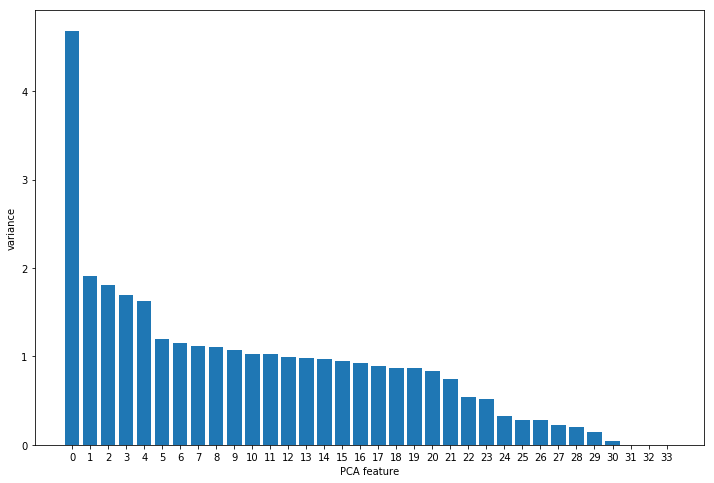

First variable
15.1055068709497
first 2 variables
21.246109306923415
first 3 variables
27.06479879264435
first 3 variables
32.53777224223974
first 4 variables
37.77057651073111
first 5 variables
41.62564401795957


In [71]:
scaler = StandardScaler()
pca = PCA()
pipeline = make_pipeline(scaler, pca)
pipeline.fit(df)
features = range(pca.n_components_)
plt.figure(figsize=(12,8))
plt.bar(features, pca.explained_variance_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(features)
plt.show()
var = pca.explained_variance_ratio_ * 100
print("First variable")
print(var[0])
print("first 2 variables")
print(sum(var[0:2]))
print("first 3 variables")
print(sum(var[0:3]))
print("first 3 variables")
print(sum(var[0:4]))
print("first 4 variables")
print(sum(var[0:5]))
print("first 5 variables")
print(sum(var[0:6]))

In [80]:
print("First 19 Variables")
print(sum(var[0:20]))
print("First 23 Variables")
print(sum(var[0:24]))

First 19 Variables
86.66087691811482
First 23 Variables
95.16920477796148


In [82]:
stscaler = StandardScaler().fit(df)
scaled_df = stscaler.transform(df)
# Create a PCA instance with 2 components: pca
pca = PCA(n_components=23)

# Fit the PCA instance to the delta samples
pca.fit(scaled_df)

# Transform the scaled samples: pca_features
pca_features = pca.transform(scaled_df)

# Print the shape of pca_features
print(pca_features.shape)

(1470, 23)


Text(0.5, 0.98, 'Feature Comparison')

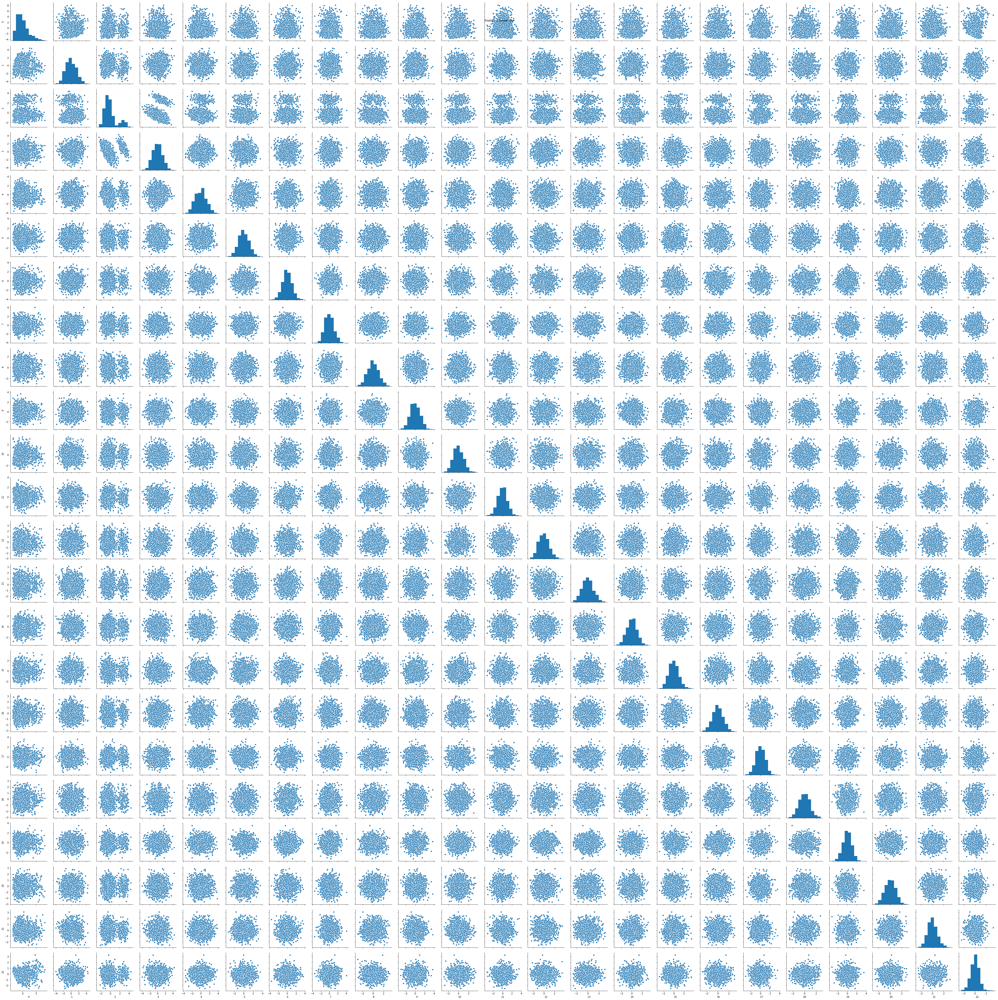

In [83]:
b = sns.pairplot(pd.DataFrame(pca_features),
                 diag_kind='hist')
b.fig.suptitle("Feature Comparison")